# Исследование данных o заведениях общественного питания Москвы.

Описание проекта
Заказчик исследования - инвесторы из фонда «Shut Up and Take My Money».
В нашем распоряжении данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Заказчик исследования инвесторы из фонда «Shut Up and Take My Money» собираются открыть заведение общественного питания в Москве.
Проведем исследование рынка Москвы, найдем интересные особенности, которые в будущем помогут в выборе подходящего инвесторам  места для открытия и категории заведения общественного питания в Москве.


Описание данных
Файл **moscow_places.csv**:


- *name* — название заведения;
- *address* — адрес заведения;
- *category* — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- *hours* — информация о днях и часах работы;
- *lat* — широта географической точки, в которой находится заведение;
- *lng8 — долгота географической точки, в которой находится заведение;
- *rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- *price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- *avg_bill* — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   «Средний счёт: 1000–1500 ₽»;
   «Цена чашки капучино: 130–220 ₽»;
   «Цена бокала пива: 400–600 ₽».и так далее;
- *middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- *middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- *chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- *district* — административный район, в котором находится заведение, например Центральный административный округ;
- *seats* — количество посадочных мест.

Презентация: <https://disk.yandex.ru/i/rbDLJHKNYqHrrQ>

### Загрузим данные и изучим общую информацию.

#### Импортируем библиотеки. Считаем данные из csv-файла в датафрейм и сохраним в переменную `data`. Выведем общую информацию о файле.

In [130]:
!pip install folium -U 

In [131]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import folium
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth

from folium import Map, Marker

from folium.plugins import MarkerCluster

pd.options.display.float_format = '{:.2f}'.format

In [132]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [133]:
data = pd.read_csv('moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В исследуемых данных представлено 8406 заведений. В таблице представлены столбцы с категориальными значениями типа object и количественные столбцы типа int64 и float64.

In [134]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


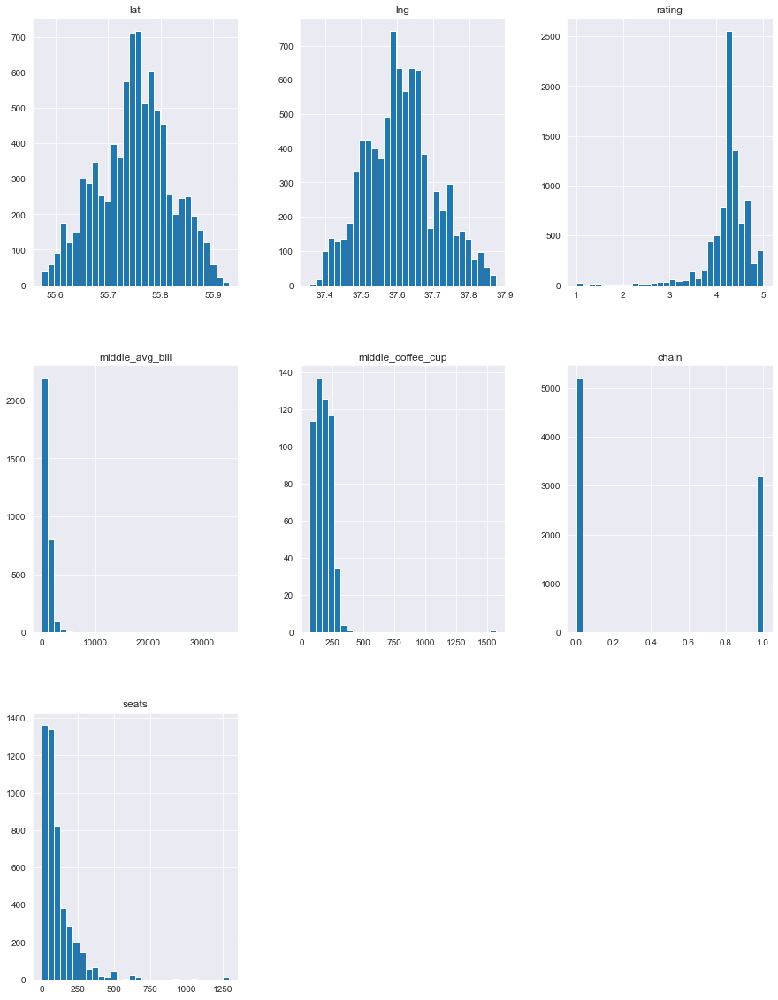

In [135]:
data.hist(bins=30, figsize=(15, 20));

В столбце **seats**  значение среднего и медианны сильно отличаются. В столбце с средней ценой за чашку кофе встречаются выбросы в виде аномально больших значений. Это необходимо учесть при дальнейшем анализе усредненных показателей.

###  Предобработка данных

#### Изучим пропуски и дубликаты.

##### Выведем количество пропущенных значений в стобцах.

In [136]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски в столбцах **middle_avg_bill, middle_coffee_cup** являются случайными. По имеющимся у нас описаниям данных известно, что значения этих столбцов получены на основании данных из столбца **avg_bill**, так же значения по среднему счету и стоимости чашки кофе являются денежными показателями. В следствии чего считаю некорректным заполнение пропусков в столбцах  **middle_avg_bill, middle_coffee_cup, avg_bill** ни медианным, ни средним значением, это может исказить анализируемые данные.

Пропусков в столбце **seats** более 50%, заполнения средним либо медианным значением может повлиять на анализ данным. Оставим пропуски без изменений.

Так же пропуски в столбце **hours** не корректно заполнять усредненными значениями, так как даже в одной сети одноименные рестораны могут работать по разным графикам.

Пропуски в столбце **price** составляют более 50%. Есть возможность заполнить их на основании значений столбца **avg_bill**, но пропусков в столбце стоимости заказа более 4500, в лучшем случае мы сможем найти значения менее чем для 10% пропусков в столбце **price**, что не сильно повлияет на общее количество пропусков. Поэтому оставим пропуски без изменений.

##### Проверим таблицу на наличие дубликатов

In [137]:
data.duplicated().sum()

0

Значение равно 0. В таблице нет явных дубликатов.


В таблице **data** есть два столбца, которые вместе должны содержать только уникальные значения.Это *name и adress*.

In [138]:
data.duplicated(subset=['name', 'address']).sum() #проверим нет ли дубликатов по адресу и названию

0

В данных нет дублированных ресторанов по одинаковому адресу.

##### Добавим новый столбцы.

Категориальные столбцы необходимы в аналитике для категоризации и анализа показателей по сформированным категориям. Анализировать данные по месторасположению заведений будет удобно по округам и улицам, на которых они распологаются. Поэтому для категоризации необходимо будет выделить из всего адреса улицу. Так же создадим столбцем, который будет информировать нас работает ли общепит круглосуточно или в определенные часы.

- Создадим столбец **street** с названиями улиц из столбца с адресом.

In [139]:
def clean(name):
    split_name = name.split(',') #разделит в каждой ячейке слова запятой и к каждому слову станет можно обратиться по индексу
    split = split_name[1] #сохранит первое значение в ячейке в переменную
    return split  

In [140]:
# применим функцию к столбцу street и сохраним в новый столбцец улицу
data['street'] = data['address'].apply(clean)
#удалим все возможные знаки препинания в начале и в конце улицы
data['street'] = data['street'].str.strip()

- Создадим столбец **is_24/7** с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

  логическое значение True — если заведение работает ежедневно и круглосуточно;
  
  логическое значение False — в противоположном случае.

In [141]:
def categorize_hour(hour):
    if hour == 'ежедневно, круглосуточно':
        return True
    else:
        return False 

In [142]:
# применим функцию к столбцу hours
data['is_24/7'] = data['hours'].apply(categorize_hour)

### Исследовательский анализ данных

#### Проанализируем  количество объектов общественного питания по категориям.

In [143]:
#сгруппируем данных по категориям и посчитаем количество заведений в каждй категории
category = pd.DataFrame(data['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=category['index'], 
                             values=category['category'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Количество объектов общественного питания по категориям', 
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Наибольшее количество заведений представлено в категории **Кафе**, они составляют 28.3% от общего рынка. Так же большую долю в 24.3% имеют **рестораны**. Эти две категории предлагают более широкое меню, их концепции затрагивают разные категории клентов, поэтому их существует на рынке гораздо больше, чем остальных. Минимальный процент заведений представлены в категории **столовая и булочная** и составляют 3,05% и 3,75% соответственно. Стоит обратить внимание на **Кофейни**, они составляют 1/6 рынка, это довольно большой процент заведений, хотя имеют узконаправленную концепцию.

#### Исследуем количество посадочных мест в местах по категориям.

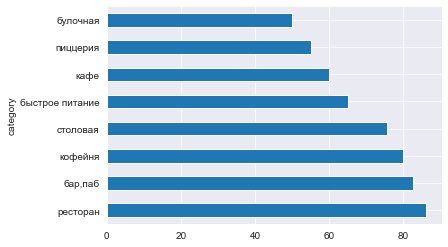

In [144]:
# Сгруппируем данные по категориям и посчитаем медианной значение посадочных мест
(data
           .pivot_table(index='category',values='seats', aggfunc='median')
           .sort_values('seats', ascending=False)
           .plot(y='seats', kind='barh', grid=True, legend=False)
);

Самое минимальное медианное значение количества посадочных мест имеют булочные и пиццерии. Наибольшее значение имеют рестораны и бары. Так же рассмотрим как распределяется количество мест по каждой категории в отдельности.

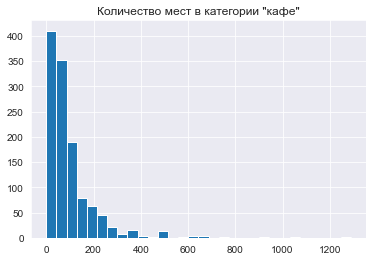

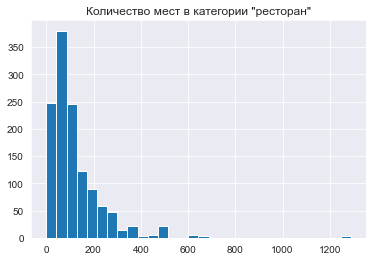

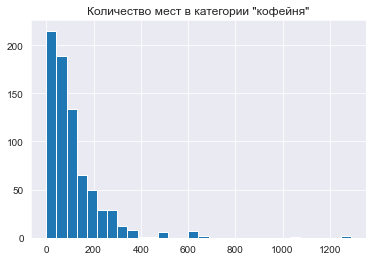

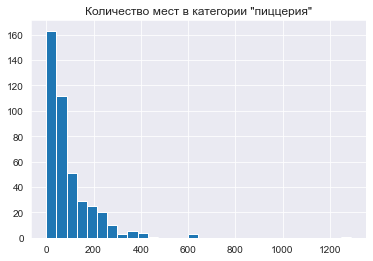

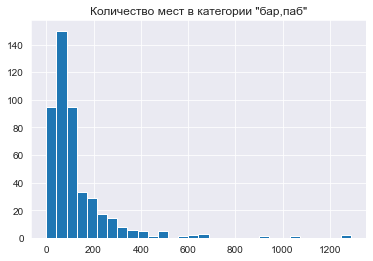

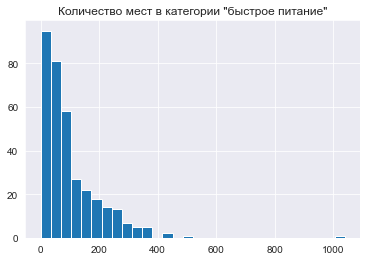

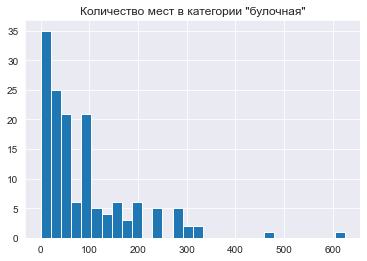

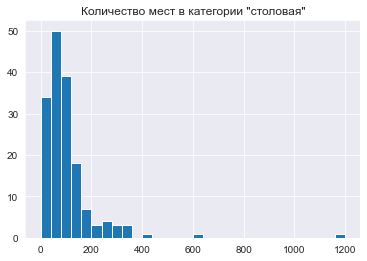

In [145]:
# напишем функцию, которая выведет по каждой категории отдельную гистограмму посадочных мест.
for index in data['category'].unique():
    data[data['category']== index].hist('seats', bins=30)
    plt.title(f'Количество мест в категории "{index}"')

В категории **кафе** около 25% заведений имею 35-40 посадочных мест. В среднем количество мест равно 60, из гистограммы видно, что есть редкие заведения с выбивающимися значениями от 750 до 1300 посадочными местами.
   
   В категории **ресторан** так же как и у кафе большая масса заведений имеют от 40 до 150 посадочных мест. Так же редко можно встретить рестораны с более чем 500 посадочными местами. Такие же показатели имеют заведения категории **бар,паб**.
   
   Категория **кофейня** встречается в Москве реже, чем рестораны и кафе, но она не уступает им по количеству посадочных мест. Около 50% заведений имеют до 80 посадочных мест, только 25% кофеен Москвы имеют более 145 мест в заведении.
   
   Основное количество пиццерий имеют от 30 до 120 посадочных мест. Пиццерия "Мюнгер" выбивается из общей массы заведений и имеет 1288 посадочных мест. 
   
   
   До 50 % заведений **быстрого питания**  имеют не более 65 посадочных мест, только 25% имеют более 140 мест.
   
   
   **Булочные** чаще всего открывают на небольшое количество посадочных мест, от 25 до 100 мест имеет основаная масса заведений.
   
   
   **Столовые** в Москве предусматривают от 40 мест, так же 75% заведений имеют до 120 посадочных мест.

#### Проанализируем соотношение сетевых и несетевых заведений в датасете.

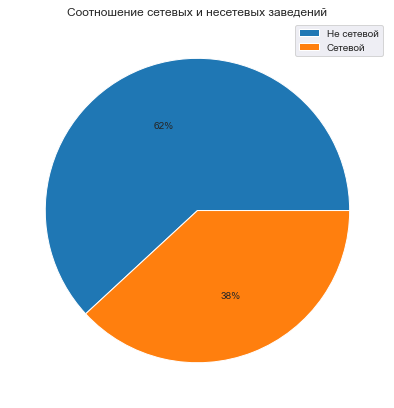

In [146]:
(data.groupby('chain')['chain'].agg('count')
     .plot(kind='pie', labels=None, label='', autopct='%1.0f%%', figsize=(7,7), 
           title='Соотношение сетевых и несетевых заведений'))

plt.legend(['Не сетевой', 'Сетевой'])
plt.show()

На основании данных можно сделать вывод что 62% заведений являются не сетевыми в Москве.

Рассмотрим какие категории заведений чаще являются сетевыми.

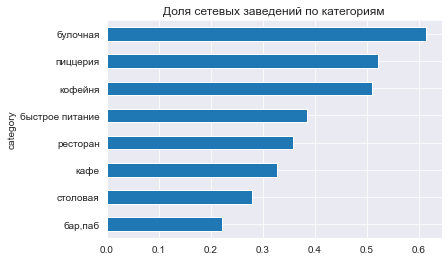

In [147]:
#сгруппируем по категориям и высчитаем долю сетевых заведений в каждой категории
df = data.pivot_table(index='category', values='chain', aggfunc=['count','sum','mean'])
df.columns = ['Количество заведений', 'Количество сетевых', 'Доля сетевых']
#посртоим график
(df    
    .sort_values('Доля сетевых')
    .plot(y='Доля сетевых', kind='barh', legend=False, grid=True)
);

plt.title('Доля сетевых заведений по категориям');

Более 60% заведений в категории **булочная** являются сетевыми. Половина кофеен и пиццерий открываются в рамках сетевых проектов. От 30% до 40% реторанов, кафе и общепитов категории быстрого питания являются сетевыми. Реже всего сети открывают бары и пабы, лишь 22% из них являются сетевыми.

#### Рассмотрим топ-15 популярных сетей в Москве. Проанализируем к каким категориям заведений они относятся и в каких районах представлены.

In [148]:
#сгруппируем данные по имени заведения и категории и посчитаем у каждого название сумму по столбцу chain,
#что покажет нам только сетевые рестораны 
top = data.pivot_table(index=['name','category'], values='chain', aggfunc='sum').reset_index()
top.columns = ['Название', 'Категория', 'Количество ресторанов в сети']
top = top.sort_values('Количество ресторанов в сети', ascending=False).head(15)

# строим столбчатую диаграмму 
fig = px.bar(top.sort_values(by='Количество ресторанов в сети', ascending=True), 
             x='Количество ресторанов в сети', 
             y='Название', 
             text='Категория'
            )

fig.update_layout(title='ТОП-15 сетевых заведений Москвы',
                   xaxis_title='Количество ресторанов в сети',
                   yaxis_title='')
fig.show() 

Самая крупная сеть в анализируемых данных это сеть кофеен "Шоколадница", она имеет почти 119 заведений в городе и лидирует с большим отрывом. В ТОП-15 заведений вошли 6 кофеен, 2 пиццерии, 3 ресторана и 3 кафе, и 1 болочная.

In [149]:
list_name = top['Название'].unique() #создадим список ТОП-15 названий сетевых ресторанов

data_new = data.query('name in @list_name') #отфильтруем файл и создадим новый с ресторанами из ТОП-15 сетевых

# сгруппируем таблицу,включающую только ТОП-15 сетей по районам и категориям и посчитаем количество заведений
data_new = data_new.pivot_table(index='district',  columns='category', values='name', aggfunc='count')
data_new.columns = ['булочная','быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан']
#создадим новый столбец с суммой ресторанов в каждом районе
data_new['всего'] = data_new[['булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан']].sum(axis=1)
# отсортируем файл по столбцу с общим числом заведений в районе
data_new = data_new.reset_index().sort_values(by='всего', ascending=False)

In [150]:
# строим столбчатую диаграмму 
fig = px.bar(data_new.sort_values(by='всего', ascending=True),
             x=['булочная', 'быстрое питание','кафе','кофейня','пиццерия','ресторан'],
             y='district'
            )
# оформляем график
fig.update_layout(title='Распределение ТОП-15 сетевых заведений в Москве по административным округам',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  legend_title_text='Категория заведения')


fig.show() # выводим график

Более 200 точек общепита из ТОП-15 сетей сконцентрированы в Центральном административном округе, что в два раза превышает количество заведений в Западном и Северном округах. Из них 50% это кафейни, 49 ресторанов и 37 кафе. Во всех округах кофеен значительно больше, чем иных категорий, лишь в Юго-Восточном административном округе пиццерий и кофеен одинаковое количество, 16 и 15 соответственно. Минимально ТОП-15 сетей представлены в Северо-Западном округе, количество не превышает 50 точек.

#### Проанализируем распределение точек общественного питания по административным округам г. Москва.

In [151]:
#сгруппируем данные по округам и посмотрим распределение количества заведений по разным категориям
district = data.pivot_table(index='district', columns='category', values='name', aggfunc='count').reset_index()
district['всего'] = district[['бар,паб','булочная', 'быстрое питание', 'кафе', 'кофейня', 
                              'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
district.sort_values('всего')

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
1,Западный административный округ,50,37,62,239,150,71,218,24,851
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
8,Южный административный округ,68,25,85,264,131,73,202,44,892
2,Северный административный округ,68,39,58,235,193,77,189,41,900
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [152]:
# строим столбчатую диаграмму 
fig = px.bar(district.sort_values(by='всего', ascending=True), 
             x=['бар,паб', 'булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'],
             y='district')
# оформляем график
fig.update_layout(title='Распределение заведений общественного питания в Москве по административным округам',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  legend_title_text='Категория заведения')


fig.show() # выводим график

В датасете присутствуют девять административных округов г. Москвы, не представлены только Новамосковский, Троицкий и Зеленоградский административные округа. Самое большое количество точек общественного питания находится в Центральном округе, количество их равно 2242 заведения. В Северном, Южном, Северо-Восточном, Западном и Восточных округах примерно одинаковое количество и варьируется от 800 до 900 заведений. Минимальное количество точек располагается в Северо-Западном административном округе - 409 заведений общественного питания. Во всех территориальных округах преобладающее большинство у кофеен. Рестораны, кафе и пиццерии представлены практически в одинаковом количестве в каждом районе. Менее всего популярны столовые и булочные. 

#### Проанализируем рейтинг заведений по категориям.

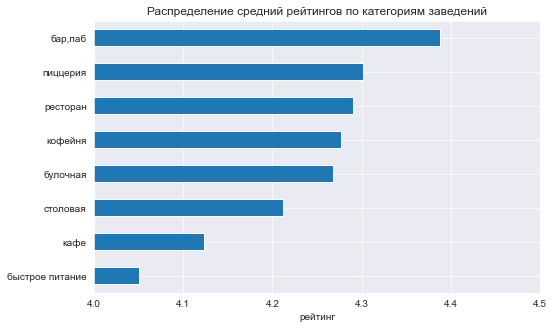

In [153]:
# сгруппируем датафрейм по категориям и рассчитаем средний рейтинг по ним, построим график
(data.groupby('category')['rating'].agg('mean')
     .sort_values()
     .plot(kind='barh', grid = True, figsize = (8, 5))
);

plt.title('Распределение средний рейтингов по категориям заведений');
plt.xlabel('рейтинг');
plt.ylabel('');
plt.xlim([4,4.5]);

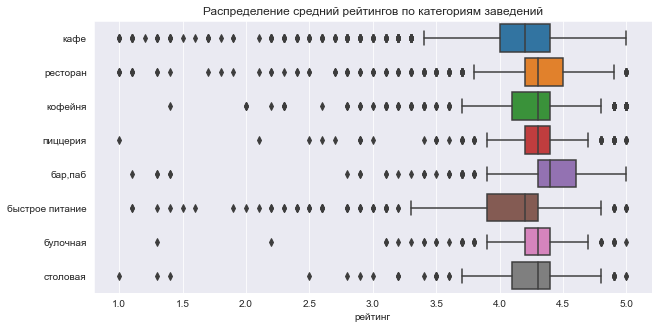

In [154]:
sns.set_style('darkgrid')
# сгруппируем датафрейм по категориям и рассчитаем средний рейтинг по ним, построим график
sns.boxplot(x='rating', y='category', data=data)
# ограничиваем ось X для наглядности

# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средний рейтингов по категориям заведений')
plt.xlabel('рейтинг');
plt.ylabel('');
plt.gcf().set_size_inches(10, 5);
# отображаем график на экране
plt.show()

Средний рейтинг по всем категориям заведений больше 4. Высокие оценки чаще всего получают бары и пабы, их средний рейтинг равен 4,39 из 5. Минимальное усредненное значение у столовых равное 4,05, что не удивительно, так как сама концепция подразумевает быстрое обслуживание, а не высокий сервис.

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [155]:
#сгруппируем данные по районам и высчитаем средний рейтинг каждому
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг у заведений, расположенных в Центральном административном округе, он равен 4,38. Так же не плохой рейтинг имеют заведения в Северном и Северо-Западном округах, равные 4,24 и 4,21 соответственно. Самый низкий рейтинг у заведений расположеных в Юго-Восточном административном округе, он равен 4,10.

#### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [156]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### Исследуем топ-15 улиц по количеству заведений.

In [157]:
#создадим таблицу с перечнем улиц с наибольшим количеством заведений на них. сохраним топ-15 таких улиц
street_pop=data.value_counts('street').reset_index().head(15)

#соеденим исходных датафрейм с таблицей топ-15 улиц, чтобы в новой таблице остались только заведения,
#находищиеся на топ-15 улицах
data_street = data.merge(street_pop, on='street', how='inner')

#сгруппируем новую таблицу по улицам и высчитаем количество заведений на каждой по категориям
data_street=data_street.pivot_table(index='street', columns='category', values='name', aggfunc='count').reset_index()


data_street['всего'] = data_street[['бар,паб','булочная', 'быстрое питание', 'кафе', 'кофейня', 
                              'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
data_street = data_street.sort_values('всего')
data_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
10,Пятницкая улица,9.00,3.00,2.00,7.00,6.00,3.00,18.00,NaN,48.00
14,улица Миклухо-Маклая,3.00,NaN,4.00,21.00,4.00,2.00,15.00,NaN,49.00
3,Кутузовский проспект,2.00,1.00,2.00,14.00,13.00,3.00,16.00,3.00,54.00
13,улица Вавилова,2.00,2.00,11.00,15.00,10.00,3.00,12.00,NaN,55.00
7,Люблинская улица,5.00,NaN,5.00,26.00,11.00,1.00,10.00,2.00,60.00
8,МКАД,1.00,NaN,9.00,45.00,4.00,NaN,5.00,1.00,65.00
5,Ленинградское шоссе,5.00,2.00,5.00,13.00,13.00,3.00,26.00,3.00,70.00
0,Варшавское шоссе,6.00,NaN,7.00,18.00,14.00,4.00,20.00,7.00,76.00
2,Каширское шоссе,2.00,NaN,10.00,20.00,16.00,5.00,19.00,5.00,77.00
1,Дмитровское шоссе,6.00,2.00,10.00,23.00,11.00,8.00,24.00,4.00,88.00


In [158]:
# строим столбчатую диаграмму 
fig = px.bar(data_street, 
             x=['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'], 
             y='street',
            )

# оформляем график
fig.update_layout(title='Распределение количества заведений общественного питания в Москве по улицам',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  legend_title_text='Категория заведения')

fig.show() # выводим график

На проспекте Мира расположенное максимальное количество заведений общественного питания равное 184 точки, больше всего здесь кафе - 53, ресторанов - 45 и кофеен - 36.. Больше 100 заведений на улицах Профсоюзная, проспект Вернадского и Ленинский проспект. Последнее место в ТОП-15 принадлежит Пятницкой улице, там расположено 48 объектов общественного питания. Распределение по категориям практически одинаковое на всех популярных улицах, болшьше всего ресторанов, кафе и кофеен. Минимально представлена категория булочная и столовая.

#### Проанализируем улицы, на которых находится только один объект общепита. 

In [159]:
#создадим таблицу one_rest, сгруппировав исходный датафрейм по улицам и количеству на них заведений.
one_rest = data.pivot_table(index='street', values='name', aggfunc='count').reset_index()

# отфильтруем таблицу, оставив только улицы, где количество заведений равно 1.
one_rest = one_rest[one_rest['name'] == 1]

# соеденим исходный датафрейм и таблицу one_rest так, чтобы в новом датафрейме осталась информация только о заведениях, 
#которые являются единственными на улице
problem = data.merge(one_rest, on='street', how='inner')

In [160]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_x']} {row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
problem.apply(create_clusters, axis=1)

# выводим карту
m

В предоставленных данный 458 объектов общественного питания находятся единственными на определенной улице. При рассмотрении карты с кафе, находящимися на целой улице без конкуренции, можно обратить внимание, что большинство из них находятся в специализированных центрах в промышленных зонах, например, кафе "Глинтвейн" в Михайловском проезде в Керлинг-клубе или "Вителия" на Большой Калитниковской в Калитниковских банях. Но так же встречаются заведения, рядом с крупными жилыми комплексами, на довольно проходимых улицах, например, "Просвет" на улице Фадеева, рядом находится ЖК "Итальянский квартал"  и университет РГГУ, такое месторасположение стоит рассматривать для открытия нового заведения.

#### Рассмотрим значения средних чеков заведений по округам. Проанализируем цены в центральном административном округе и других. Проверим влияет ли удалённость от центра  на цены в заведениях.

В исходном датафрейме в столбце **middle_avg_bill** 5257 пропущенных значений. Чтобы очистить будущую карту от неинформативных маркеров, удалим строки с пропусками в столбце среднего чека.

In [161]:
data_drop = data.dropna(subset=['middle_avg_bill'], axis=0)#удалим строки с NAN  в middle_avg_bill

#Сгруппируем таблицу по районам и высчитаем медиану среднего чека по нима
avg_data = data_drop.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

In [162]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный xtr заведений по районам',
).add_to(m)


marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_drop.apply(create_clusters, axis=1)

# выводим карту
m

В Центарльном и Западном административных округах медианное значение одинаково и равно 1000 рублей. Самый минимальный средний чек в Юго-Восточном административном округе и равен 450 рублей. В Центральном округе значение среднего чека в сетевых ресторанах ничем не отличается от цен в других округах. Но при рассмотрении заведений со средним чеком от 5000 рублей,  80% из них находятся в Центарльном округе. Если рассмотреть зависимость удаленности от центра на значение среднего чека в определенном округе, то  невозможно сделать однозначный вывод. Так в Юго-Восточном округе ресторан "Саят-Нова" неделако от МКАДа имеет средний чек в 2750 руб, а ресторан расположенный на стыке Центрального и Юго-Восточного округов имеет средний чек в размере 700 рублей.

### Общий вывод

На основании исследовательского анализа данных, можно сделать вывод:

1. Наибольшее количество заведений представлено в категории Кафе, они составляют 28.3% от общего рынка. Так же большую долю в 24.3% имеют рестораны. Эти две категории предлагают более широкое меню, их концепции затрагивают разные категории клентов, поэтому их существует на рынке гораздо больше, чем остальных. Минимальный процент заведений представлены в категории столовая и булочная и составляют 3,05% и 3,75% соответственно. Стоит обратить внимание на Кофейни, они составляют 1/6 рынка, это довольно большой процент заведений, хотя имеют узконаправленную концепцию.
2. Самое минимальное медианное значение количества посадочных мест имеют булочные и пиццерии. Наибольшее значение имеют рестораны и бары.
3. В Москве 62% заведений являются не сетевыми.
4. Самая крупная сеть в анализируемых данных это сеть кофеен "Шоколадница", она имеет почти 119 заведений в городе и лидирует с большим отрывом. В ТОП-15 заведений вошли 6 кофеен, 2 пиццерии, 3 ресторана и 3 кафе, и 1 булочная.
5. В датасете присутствуют девять административных округов г. Москвы, не представлены только Новамосковский, Троицкий и Зеленоградский административные округа. Самое большое количество точек общественного питания находится в Центральном округе, количество их равно 2242 заведения. В Северном, Южном, Северо-Восточном, Западном и Восточных округах примерно одинаковое количество и варьируется от 800 до 900 заведений. Минимальное количество точек располагается в Северо-Западном административном округе - 409 заведений общественного питания. Во всех территориальных округах преобладающее большинство у кофеен. Рестораны, кафе и пиццерии представлены практически в одинаковом количестве в каждом районе. Менее всего популярны столовые и булочные.
6. Средний рейтинг по всем категориям заведений больше 4. Высокие оценки чаще всего получают бары и пабы, их средний рейтинг равен 4,39 из 5. Минимальное усредненное значение у столовых равное 4,05, что не удивительно, так как сама концепция подразумевает быстрое обслуживание, а не высокий сервис.
7. Самый высокий средний рейтинг у заведений, расположенных в Центральном административном округе, он равен 4,38. Так же не плохой рейтинг имеют заведения в Северном и Северо-Западном округах, равные 4,24 и 4,21 соответственно. Самый низкий рейтинг у заведений расположеных в Юго-Восточном административном округе, он равен 4,10.
8. На проспекте Мира расположенное максимальное количество заведений общественного питания равное 184 точки, больше всего здесь кафе - 53, ресторанов - 45 и кофеен - 36. Больше 100 заведений на улицах Профсоюзная, проспект Вернадского и Ленинский проспект. Последнее место в ТОП-15 принадлежит Пятницкой улице, там расположено 48 объектов общественного питания. Распределение по категориям практически одинаковое на всех популярных улицах, болшьше всего ресторанов, кафе и кофеен. Минимально представлена категория булочная и столовая.
9. В предоставленных данный 458 объектов общественного питания находятся единственными на определенной улице. При рассмотрении карты с кафе, находящимися на целой улице без конкуренции, можно обратить внимание, что большинство из них находятся в специализированных центрах в промышленных зонах, например, кафе "Глинтвейн" в Михайловском проезде в Керлинг-клубе или "Вителия" на Большой Калитниковской в Калитниковских банях. Но так же встречаются заведения, рядом с крупными жилыми комплексами, на довольно проходимых улицах, например, "Просвет" на улице Фадеева, рядом находится ЖК "Итальянский квартал" и университет РГГУ, такое месторасположение стоит рассматривать для открытия нового заведения.
10. В Центаральном и Западном административных округах медианное значение одинаково и равно 1000 рублей. Самый минимальный средний чек в Юго-Восточном административном округе и равен 450 рублей. В Центральном округе значение среднего чека в сетевых ресторанах ничем не отличается от цен в других округах. Но при рассмотрении заведений со средним чеком от 5000 рублей, 80% из них находятся в Центарльном округе. Если рассмотреть зависимость удаленности от центра на значение среднего чека в определенном округе, то невозможно сделать однозначный вывод. Так в Юго-Восточном округе ресторан "Саят-Нова" неделако от МКАДа имеет средний чек в 2750 руб, а ресторан расположенный на стыке Центрального и Юго-Восточного округов имеет средний чек в размере 700 рублей.

### Детализация исследования: открытие кофейни.

Основатели фонда «Shut Up and Take My Money» хотели бы открыть кофейню похожую на «Central Perk» их сериала Друзья, такую же крутую и доступную. Заказчики не боятся конкуренции в этой сфере. Составим рекомендацию для открытия нового заведения. 

In [163]:
#отфильтруем исходный датафрейм и создадим табл. cofee_shop, в которую войдут только информация по заведениям категории кафейня
coffee_shop = data[data['category']== 'кофейня']

In [164]:
print('В предоставленных данных' , coffee_shop.shape[0], 'кофейни')

В предоставленных данных 1413 кофейни


- Проанализируем распределение кофеен по округам Москвы

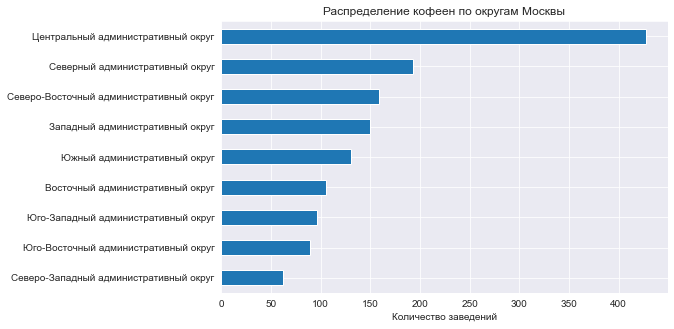

In [165]:
# сгруппируем датафрейм по округам и посчитаем количество заведений в каждом
(coffee_shop.groupby('district')['name'].agg('count')
           .sort_values()
           .plot(kind='barh', grid = True, figsize = (8, 5))
);

plt.title('Распределение кофеен по округам Москвы');
plt.xlabel('Количество заведений');
plt.ylabel('');

С большим числовым отрывом лидирует Центральный административный округ, там находится 428 кофейни. В два раза меньше кофеен в Северном административном округе, их 193. Минимальное количество кофеен в Северо-Западном административном округе, здесь находится 62 точки данной категории.

- Проанализируем часы работы заведений.

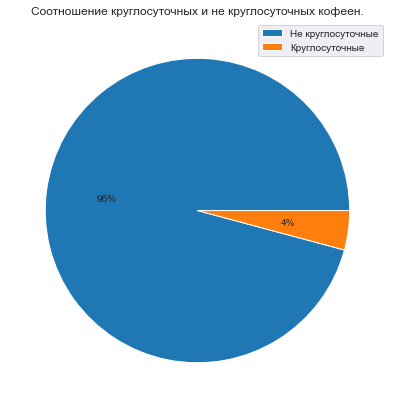

In [166]:
#Посчитаем количество круглосуточных кофеен и не круглосуточных, построим круговую диаграмму
(coffee_shop.value_counts('is_24/7')
            .plot(kind='pie', labels=None, label='', autopct='%1.0f%%', figsize=(7,7),
                  title='Соотношение круглосуточных и не круглосуточных кофеен.'))

plt.legend(['Не круглосуточные', 'Круглосуточные'])
plt.show()

Всего 4% кофеен работают круглосуточно, 96% кофеен работают по установленному графику. Потребность людей в кофе ночью минимальна, поэтому работа кофеен круглосуточно не целесообразна.

- Исследуем рейтинги и их среднее значение по районам.

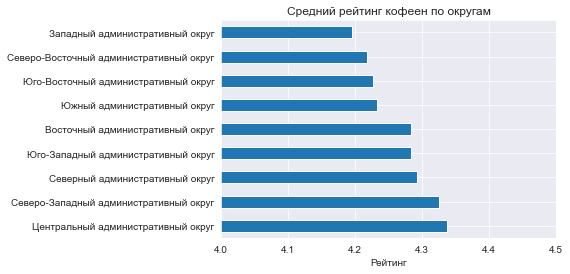

In [167]:
#сгруппируем таблицу по районам и посмотрим их средние рейтинги
(coffee_shop
           .pivot_table(index='district', values='rating')
           .sort_values('rating', ascending=False)
           .plot(y='rating', kind='barh', legend=False, grid=True)
);

plt.xlim([4,4.5]);
plt.title('Средний рейтинг кофеен по округам');
plt.xlabel('Рейтинг');
plt.ylabel('');

Самый высокий рейтинг у кофеен в Центральном и Северо-Западном административных округах. Минимальный средний рейтинг демонстрируют Северо-Восточный и Западный административные округа.

- Исследуем среднюю стоимость кружки кофе по районам.

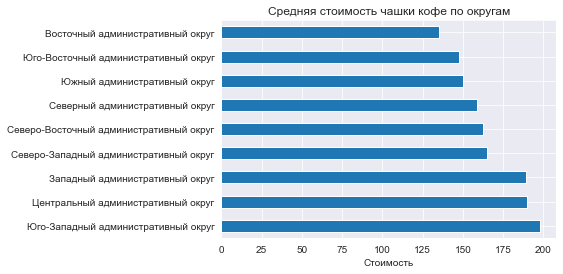

In [168]:
(coffee_shop
                     .pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')
                     .sort_values('middle_coffee_cup', ascending=False)
                     .plot(y='middle_coffee_cup', kind='barh', legend=False, grid=True)
);

plt.title('Средняя стоимость чашки кофе по округам');
plt.xlabel('Стоимость');
plt.ylabel('');

Самый дорогой средний чек за кофе равен 198 рублям в Юго-Западном районе, Так же среднее значение равное 190 руб. в Центральном и Западном административных округах. В Восточном округе можно попробовать самый недорогой кофе, средний счет за него в кофейнях равен 135 рублей.

### Вывод

На основании проведенного исследования можно рекомендовать следующее.

Из 1413 кофеен в Москве всего 62 расположены в Северо-Западном административном округе, в этом районе будет минимальная конкуренция. Заведения в данном округе получают хорошие оценки, средний рейтинг кофеен равен 4,33. Чашка кофе в Северо-Западном округе стоит 165 рублей, что является средним показателем по районам, стоит ориентироваться на данную стоимость при разработке ценовой политики. Круглосуточных кофеен в Москве всего 4%, и располагаются они в основном на вокзалах или аэропортах. Считаем не целесообразным открытие круглосуточного заведения в самой Москве. Так же рекомендуем рассмотреть для открытия кофейни улицы, на которых расположены заведения иных категорий, но нет кофеен. Например, в Северо-Западном административном округе в районе ходынского поля, где расположено большое количество новых жилых комплексов и бизнес-центров.